# Classification network

In [1]:
import random
import cv2
import numpy as np
import PIL
import os
import sys
import glob
from PIL import Image
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity

from tensorflow.keras.metrics import Precision, Recall


from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Lambda, BatchNormalization, Dropout
from tensorflow.keras.models import Model
import tensorflow.keras.backend as K
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import Sequence
from tensorflow.keras.callbacks import ReduceLROnPlateau

from tensorflow.keras.optimizers import Adam
import tensorflow as tf
from tensorflow.keras.models import load_model


In [2]:
def imshow(a, size=1.0):
    # if image was normalized
    if a.max() <= 1.0:
        a = (a * 255).astype("uint8")

    # Clip and convert the image to uint8
    elif a.dtype != np.uint8:
        a = np.clip(a, 0, 255).astype("uint8")
    
    # Resize the image if a size factor is provided
    if size != 1.0:
        new_dim = (int(a.shape[1] * size), int(a.shape[0] * size))
        a = cv2.resize(a, new_dim, interpolation=cv2.INTER_AREA)
    
    # Convert color format if needed
    if a.ndim == 3:
        if a.shape[2] == 4:
            a = cv2.cvtColor(a, cv2.COLOR_BGRA2RGBA)
        else:
            a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    
    # Display the image
    display(PIL.Image.fromarray(a))

## Train val split

split to train and val as the test images will not be from dataset 

In [3]:
base_dir = "/kaggle/input/search-engine-data-small/Data"

def get_split_paths_labels(base_dir, num_folders=None):
    """
    data sturcture: base_dir/class_name/image.jpg,
    splits the data into train, validation sets, such that 90% of the data from each folder is used for training, 10% for validation 
    if one wants to use less than the whole data -> change the num_folders parameter (each folder contains about 100+ images)
    returns: train_paths, train_labels, val_paths, val_labels
    """
    # folder_names = os.listdir(base_dir)
    folder_names = sorted(os.listdir(base_dir))
    if num_folders:
        folder_names = folder_names[:num_folders]
    train_paths = []
    train_labels = []
    val_paths = []
    val_labels = []

    for folder in folder_names:
        label = folder[:3]
        image_files = glob.glob(os.path.join(base_dir, folder, "*.jpg"))
        random.shuffle(image_files)

        num_images = len(image_files)
        train_split = int(0.9 * num_images) # 90% goes to train

        train_files = image_files[:train_split]
        val_files = image_files[train_split:]

        train_paths.extend(train_files)
        train_labels.extend([label] * len(train_files))

        val_paths.extend(val_files)
        val_labels.extend([label] * len(val_files))
        
    return train_paths, train_labels, val_paths, val_labels

## Preprocessing

In [4]:
def resize_crop(image, image_size=(256, 256)):
    target_height, target_width = image_size
    original_height, original_width = image.shape[:2]

    original_aspect = original_width / original_height
    target_aspect = target_width / target_height

    if original_aspect > target_aspect:
        new_width = original_height
        crop_x = (original_width - new_width) // 2
        cropped_image = image[:, crop_x:crop_x + new_width]
    elif original_aspect < target_aspect:
        new_height = original_width
        crop_y = (original_height - new_height) // 2
        cropped_image = image[crop_y:crop_y + new_height, :]
    else:
        cropped_image = image

    resized_image = cv2.resize(cropped_image, (target_width, target_height))
    return resized_image

def preprocess(image):
    image = image / 255.0
    image = resize_crop(image)
    image = cv2.GaussianBlur(image, (5, 5), 0)
    return image

def read_image(image_file):
    image = cv2.imread(image_file)
    image = preprocess(image) 
    return image    

## Data generator

In [5]:
class CustomDataGenerator(Sequence):
    def __init__(self, paths, labels, num_classes, batch_size=32, image_size=(256, 256), shuffle=True):
        self.paths = paths
        self.labels = labels
        self.batch_size = batch_size
        self.image_size = image_size
        self.shuffle = shuffle
        self.num_classes = num_classes
        self.indexes = np.arange(len(self.paths))
        if self.shuffle:
            np.random.shuffle(self.indexes)

    """
    read_images 
    reads image, 
    preproces image (normalize, resize(by cropping), blur)
    """
    def read_image(self, image_file):
        image = cv2.imread(image_file)
        image = self.preprocess(image) 
        return image        

    """
    resize_crop
    resizes to desired size by cropping the image,
    in order to not strech the picture
    """
    def resize_crop(self, image):
        target_height, target_width = self.image_size
        original_height, original_width = image.shape[:2]

        original_aspect = original_width / original_height
        target_aspect = target_width / target_height

        if original_aspect > target_aspect:
            new_width = original_height
            crop_x = (original_width - new_width) // 2
            cropped_image = image[:, crop_x:crop_x + new_width]
        elif original_aspect < target_aspect:
            new_height = original_width
            crop_y = (original_height - new_height) // 2
            cropped_image = image[crop_y:crop_y + new_height, :]
        else:
            cropped_image = image

        resized_image = cv2.resize(cropped_image, (target_width, target_height))
        return resized_image

    def preprocess(self, image):
        image = image / 255.0
        image = self.resize_crop(image)
        image = cv2.GaussianBlur(image, (5, 5), 0)
        return image


    def __len__(self):
        return int(np.ceil(len(self.paths) / self.batch_size))

    """
    selects batch indices,
    loads and preprocesses the batch images,
    returns batch of images and labels
    """
    def __getitem__(self, index):
        # select a batch of indexes
        # batch_indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]
        start = index * self.batch_size
        end = start + self.batch_size
        batch_indexes = self.indexes[start:end]

        if end > len(self.paths):
            batch_indexes = np.concatenate([batch_indexes, self.indexes[:end - len(self.paths)]])
            
        batch_images = []
        batch_labels = []

        # load and preprocess the batch
        for i in batch_indexes:
            path = self.paths[i]
            label = self.labels[i]
            label = int(label)
            
            one_hot_label = np.zeros(self.num_classes)
            one_hot_label[label-1] = 1

            image = self.read_image(path)


            batch_images.append(image)
            batch_labels.append(one_hot_label)

        # convert to numpy arrays
        batch_images = np.array(batch_images, dtype=np.float32)
        batch_labels = np.array(batch_labels, dtype=np.float32)

        return batch_images, batch_labels        

        
    def on_epoch_end(self):
        self.indexes = np.arange(len(self.paths))
        if self.shuffle:
            np.random.shuffle(self.indexes)



106


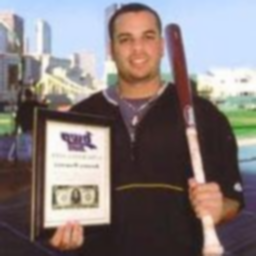

[0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
322
10296
1200


In [6]:
base_dir = "/kaggle/input/search-engine-data-small/Data"
train_paths, train_labels, val_paths, val_labels = get_split_paths_labels(base_dir)
batch_size = 32
num_classes = len(np.unique(train_labels))
print(num_classes)
example_data_generator = CustomDataGenerator(train_paths, train_labels, num_classes)
x, y = example_data_generator[16]
imshow(x[1])
print(y[1])
print(len(example_data_generator))
print(len(train_paths))
print(len(val_paths))



## Classification model

In [7]:
def build_classification_network(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(inputs)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = BatchNormalization()(x)
    
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = BatchNormalization()(x)
    
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = BatchNormalization()(x)
    
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = BatchNormalization()(x)
    
    x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    
    x = Flatten()(x)
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.3)(x)  
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.3)(x)  
    
    outputs = Dense(num_classes, activation='softmax')(x)
    
    model = Model(inputs, outputs)
    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy',
                                                                              Precision(name='precision'),
                                                                              Recall(name='recall')])
    
    return model


In [8]:
base_dir = "/kaggle/input/search-engine-data-small/Data"
train_paths, train_labels, val_paths, val_labels = get_split_paths_labels(base_dir)

print(len(train_paths))
print(len(val_paths))
input_shape = (256, 256, 3) 
num_classes = len(np.unique(train_labels))

model = build_classification_network(input_shape, num_classes)

train_generator = CustomDataGenerator(train_paths, train_labels, batch_size=32, image_size=(256, 256), shuffle=True, num_classes=num_classes)
val_generator = CustomDataGenerator(val_paths, val_labels, batch_size=32, image_size=(256, 256), shuffle=False, num_classes=num_classes)

10296
1200


In [9]:
early_stopping = EarlyStopping(
    monitor="val_loss", 
    patience=10,     
    verbose = True,
    restore_best_weights=True  
)

lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',  
    factor=0.2,          
    patience=4,          
    min_lr=1e-6,         
    verbose=1            
)

history = model.fit(
    train_generator,
    epochs=50,  
    validation_data=val_generator,
    callbacks=[early_stopping, lr_scheduler]
)


Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


322/322 ━━━━━━━━━━━━━━━━━━━━ 145s 378ms/step - accuracy: 0.0337 - loss: 4.6434 - precision: 0.2684 - recall: 4.7182e-04 - val_accuracy: 0.0600 - val_loss: 4.4521 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 0.0010
Epoch 2/50
322/322 ━━━━━━━━━━━━━━━━━━━━ 78s 238ms/step - accuracy: 0.1069 - loss: 4.0777 - precision: 0.4110 - recall: 0.0108 - val_accuracy: 0.1209 - val_loss: 3.8787 - val_precision: 0.6452 - val_recall: 0.0164 - learning_rate: 0.0010
Epoch 3/50
322/322 ━━━━━━━━━━━━━━━━━━━━ 79s 241ms/step - accuracy: 0.1613 - loss: 3.7451 - precision: 0.5763 - recall: 0.0298 - val_accuracy: 0.2007 - val_loss: 3.5936 - val_precision: 0.6907 - val_recall: 0.0551 - learning_rate: 0.0010
Epoch 4/50
322/322 ━━━━━━━━━━━━━━━━━━━━ 77s 233ms/step - accuracy: 0.1965 - loss: 3.4890 - precision: 0.5983 - recall: 0.0509 - val_accuracy: 0.1924 - val_loss: 3.6308 - val_precision: 0.5369 - val_recall: 0.0896 - learning_rate: 0.0010
Epoch 5/50
322/322 ━━━━━━━━━━━━━━━━━━━━ 77s 233ms/

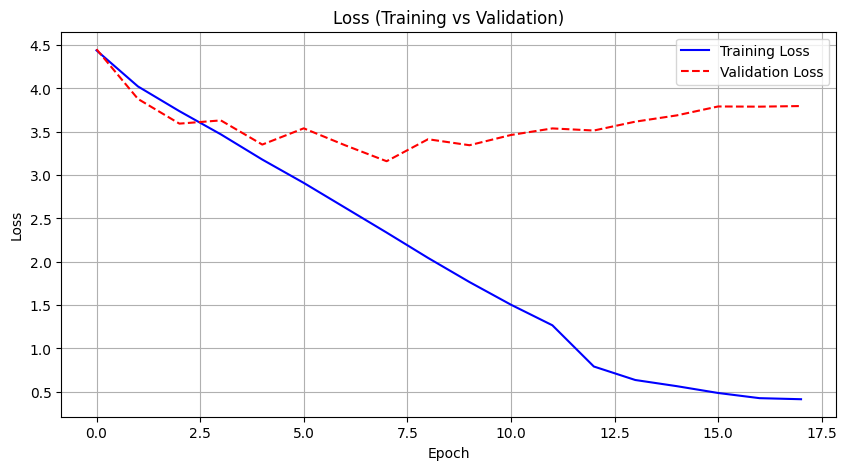

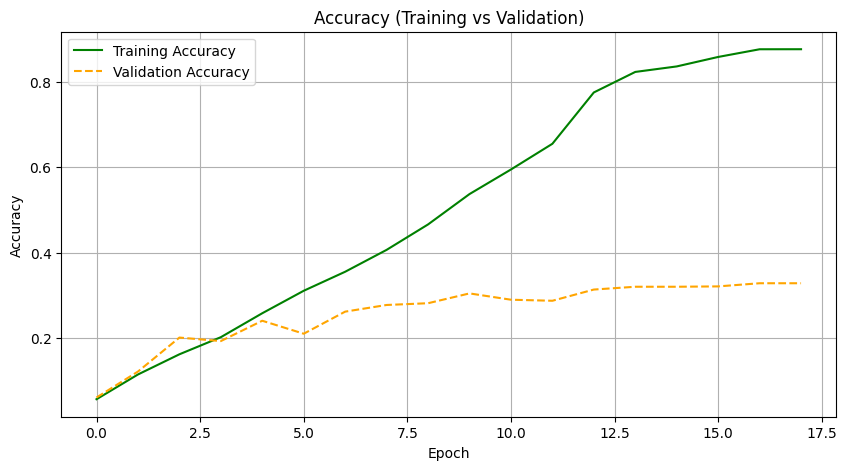

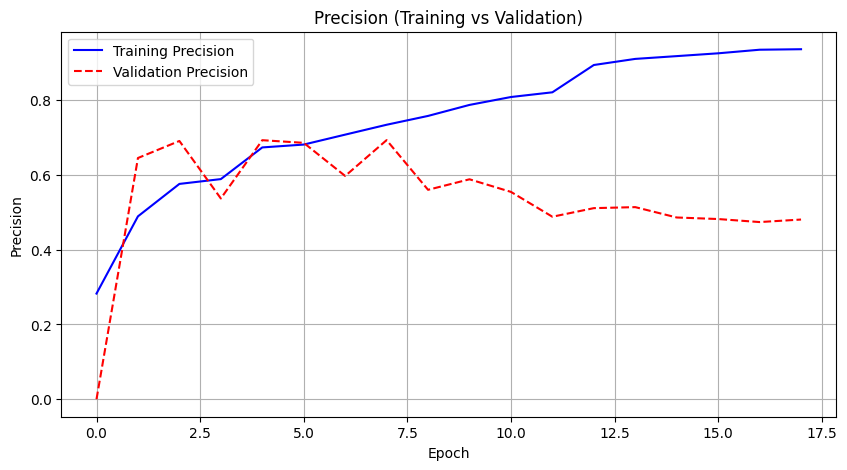

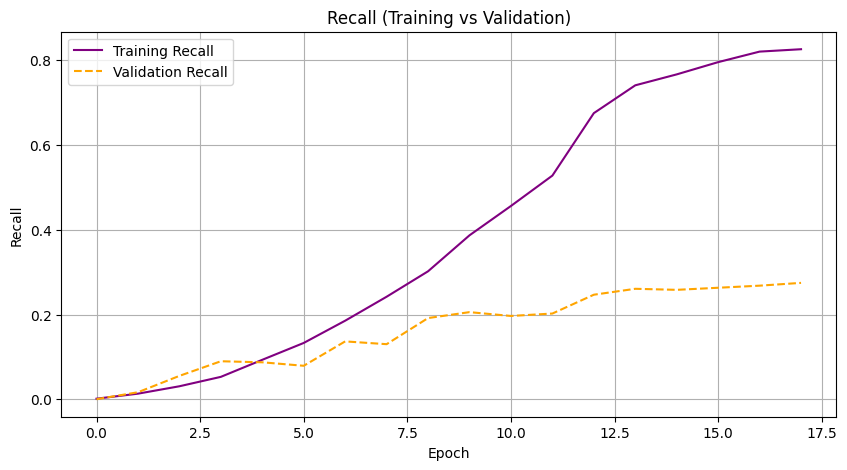

In [11]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_precision = history.history['precision']
val_precision = history.history['val_precision']
train_recall = history.history['recall']
val_recall = history.history['val_recall']

# Plot loss
plt.figure(figsize=(10, 5))
plt.plot(train_loss, label='Training Loss', color='blue')
plt.plot(val_loss, label='Validation Loss', color='red', linestyle='--')
plt.title('Loss (Training vs Validation)')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# Plot accuracy
plt.figure(figsize=(10, 5))
plt.plot(train_accuracy, label='Training Accuracy', color='green')
plt.plot(val_accuracy, label='Validation Accuracy', color='orange', linestyle='--')
plt.title('Accuracy (Training vs Validation)')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# Plot precision
plt.figure(figsize=(10, 5))
plt.plot(train_precision, label='Training Precision', color='blue')
plt.plot(val_precision, label='Validation Precision', color='red', linestyle='--')
plt.title('Precision (Training vs Validation)')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.legend()
plt.grid(True)
plt.show()

# Plot recall
plt.figure(figsize=(10, 5))
plt.plot(train_recall, label='Training Recall', color='purple')
plt.plot(val_recall, label='Validation Recall', color='orange', linestyle='--')
plt.title('Recall (Training vs Validation)')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.legend()
plt.grid(True)
plt.show()


## Extract embeddings

In [195]:
def build_embedding_model(original_model):
    embedding_model = Model(inputs=original_model.input, outputs=original_model.get_layer('dense_52').output)
    return embedding_model

embedding_model = build_embedding_model(model)

In [ ]:
def extract_and_save_embeddings(image_paths, base_dir, embedding_model, save_path='embeddings.csv'):
    embeddings = []
    filenames = []
    
    for image_path in image_paths:
        image = read_image(image_path)
        image = np.expand_dims(image, axis=0)  
        
        embedding = embedding_model.predict(image)
        
        embeddings.append(embedding.flatten())
        filenames.append(os.path.relpath(image_path, base_dir))  
    
    embeddings = np.array(embeddings)
    df = pd.DataFrame(embeddings)
    df['filename'] = filenames
    df.to_csv(save_path, index=False)
    print(f"Embeddings saved to {save_path}")

base_dir = "/kaggle/input/search-engine-data-small/Data"
extract_and_save_embeddings(train_paths+val_paths, base_dir, embedding_model, save_path='embeddings.csv')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━

In [204]:
def get_most_similar_images(query_image_path, base_dir, embedding_model, embeddings_df, k=5):
    query_image = read_image(query_image_path)
    query_image = np.expand_dims(query_image, axis=0)
    
    query_embedding = embedding_model.predict(query_image).flatten()
    
    embeddings = embeddings_df.drop(columns=['filename']).values
    filenames = embeddings_df['filename'].values
    
    similarities = cosine_similarity([query_embedding], embeddings)
    
    top_k_indices = similarities[0].argsort()[-k:][::-1]
    
    most_similar_filenames = filenames[top_k_indices]
    
    return most_similar_filenames, similarities[0][top_k_indices]



def display_top_k(query_image_path, top_k_filenames, similarities, base_dir, k=5):
    fig, axes = plt.subplots(1, k + 1, figsize=(15, 5))  # 1 for query, k for top results

    query_image = read_image(query_image_path)
    axes[0].imshow(plt.imread(query_image_path))
    axes[0].set_title("Query")
    axes[0].axis('off')
    
    for i, ax in enumerate(axes[1:]):
        img_path = os.path.join(base_dir, top_k_filenames[i])
        img = plt.imread(img_path)
        ax.imshow(img)
        ax.set_title(f"Sim: {similarities[i]:.2f}")
        ax.axis('off')
    
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Most similar images to 029.jpg:
084.giraffe/084_0080.jpg - Similarity: 0.7961136847254693
029.cannon/029_0011.jpg - Similarity: 0.7891986914566561
084.giraffe/084_0061.jpg - Similarity: 0.7839345176103726
092.grapes/092_0194.jpg - Similarity: 0.7802655612872966
029.cannon/029_0006.jpg - Similarity: 0.7773018103293008


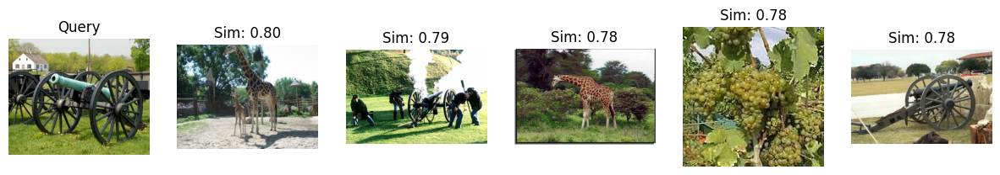

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Most similar images to 014.jpg:
014.blimp/014_0008.jpg - Similarity: 0.8414450150563523
069.fighter-jet/069_0013.jpg - Similarity: 0.8358596825364094
069.fighter-jet/069_0085.jpg - Similarity: 0.8111048379875946
014.blimp/014_0069.jpg - Similarity: 0.7922971626089709
014.blimp/014_0039.jpg - Similarity: 0.7796495020667733


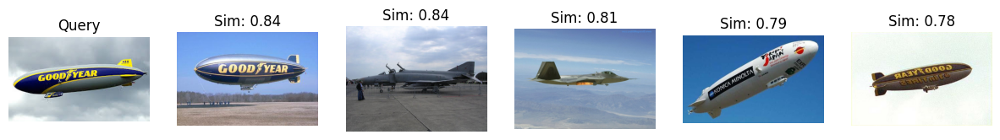

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 034.jpg:
093.grasshopper/093_0111.jpg - Similarity: 0.7648405739113472
052.crab-101/052_0002.jpg - Similarity: 0.7484615330503596
052.crab-101/052_0075.jpg - Similarity: 0.7471528654385029
052.crab-101/052_0046.jpg - Similarity: 0.7425360177247592
052.crab-101/052_0032.jpg - Similarity: 0.7373435577712864


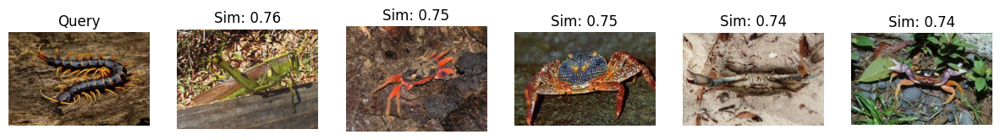

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 024.jpg:
061.dumb-bell/061_0098.jpg - Similarity: 0.6190188869958219
059.drinking-straw/059_0029.jpg - Similarity: 0.5993639276452071
074.flashlight/074_0018.jpg - Similarity: 0.596052568151525
061.dumb-bell/061_0089.jpg - Similarity: 0.5797642654306213
094.guitar-pick/094_0028.jpg - Similarity: 0.5756584640338087


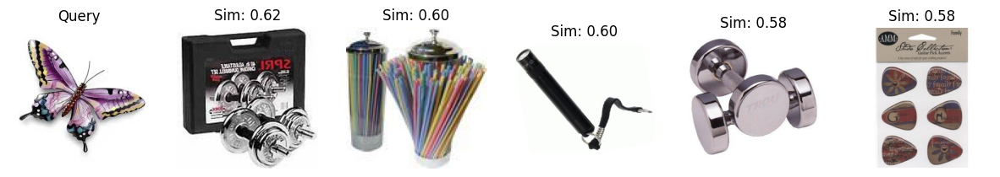

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Most similar images to 033.jpg:
033.cd/033_0022.jpg - Similarity: 0.8737305504474269
033.cd/033_0019.jpg - Similarity: 0.8686536229969798
033.cd/033_0023.jpg - Similarity: 0.8595666484188715
033.cd/033_0008.jpg - Similarity: 0.8465194008407704
033.cd/033_0017.jpg - Similarity: 0.8210118663284426


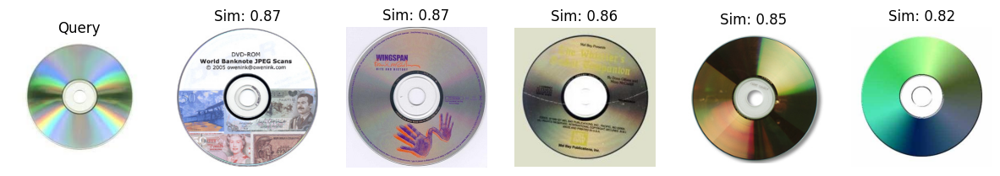

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 106.jpg:
106.vase/bloomr-vases-ceramic-vase-artificial-flowers-artificial-trees-artificial-plants-dubai-saudi-arabia-uae-35105828503714.jpg - Similarity: 0.9698023129219019
106.vase/001-CEGR3001006-ancient-greek-black-figure-vase_e659f8d9-da74-40f7-b7ae-fd5ae59384fc.jpg - Similarity: 0.7500318561424445
106.vase/12839-antique-french-ormolu-mounted-sevres-style-porcelain-vase-1-2000x.jpg - Similarity: 0.7463541552185163
106.vase/Chinese-White-and-Blue-Cherry-Blossom-Moon-Flask-Vase-NWL2382-1-lg.jpg - Similarity: 0.7201829349653373
008.bathtub/008_0059.jpg - Similarity: 0.6925082351359215


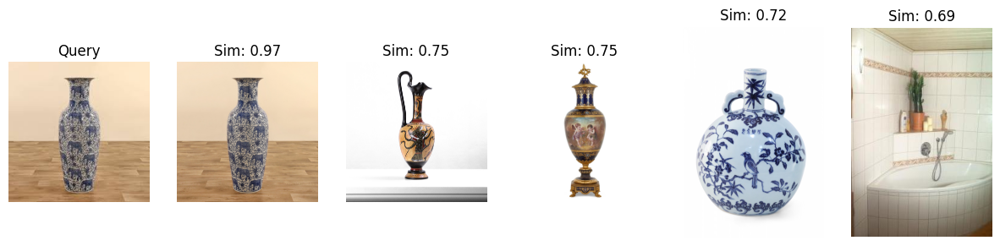

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 006.jpg:
033.cd/033_0026.jpg - Similarity: 0.7985382875939459
033.cd/033_0060.jpg - Similarity: 0.7533730260215367
076.football-helmet/076_0033.jpg - Similarity: 0.7198243262744973
016.boom-box/016_0058.jpg - Similarity: 0.7196878515230826
041.coffee-mug/041_0046.jpg - Similarity: 0.7014546203007226


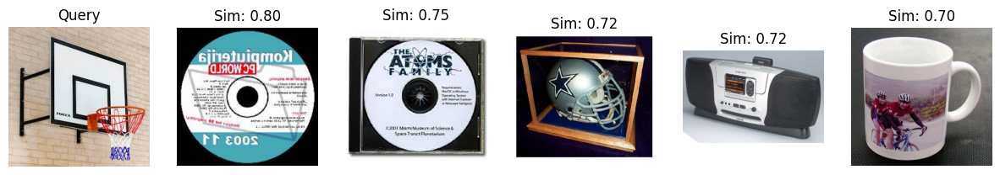

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Most similar images to 011.jpg:
073.fireworks/073_0096.jpg - Similarity: 0.6754980670697335
079.frisbee/079_0032.jpg - Similarity: 0.6576834782561507
011.billiards/011_0178.jpg - Similarity: 0.6525940336321755
088.golf-ball/088_0059.jpg - Similarity: 0.6413586935599864
046.computer-monitor/046_0053.jpg - Similarity: 0.6350796878767299


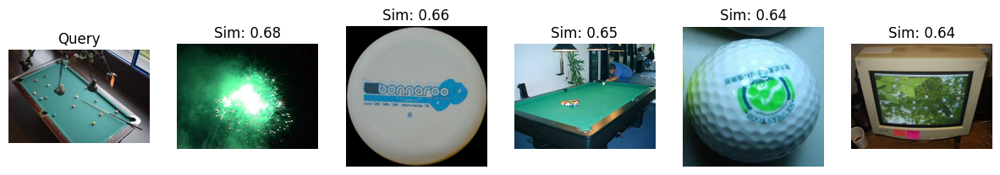

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 002.jpg:
086.golden-gate-bridge/086_0053.jpg - Similarity: 0.6816742286006614
083.gas-pump/083_0021.jpg - Similarity: 0.6499091390911512
018.bowling-pin/018_0046.jpg - Similarity: 0.643992603148572
086.golden-gate-bridge/086_0057.jpg - Similarity: 0.6262745017542656
002.american-flag/002_0044.jpg - Similarity: 0.622002755601642


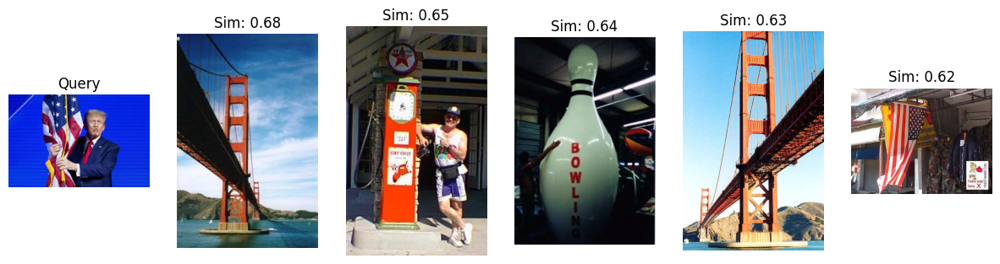

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Most similar images to 036.jpg:
044.comet/044_0108.jpg - Similarity: 0.6893866656949744
044.comet/044_0029.jpg - Similarity: 0.6722444991906371
047.computer-mouse/047_0031.jpg - Similarity: 0.6630786614602117
044.comet/044_0079.jpg - Similarity: 0.6577600827880857
044.comet/044_0078.jpg - Similarity: 0.6369946968939451


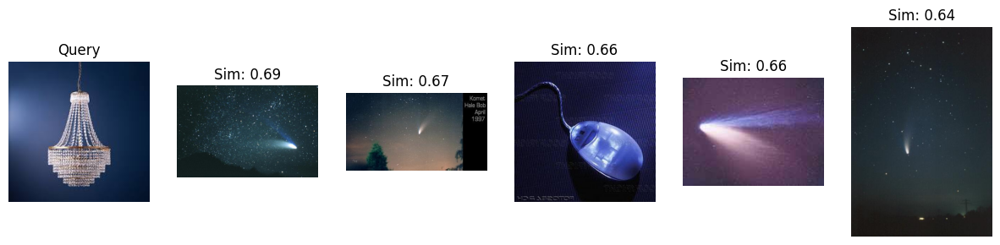

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 025.jpg:
096.hammock/096_0269.jpg - Similarity: 0.8143484051364966
098.harp/098_0023.jpg - Similarity: 0.8080998196229486
024.butterfly/024_0063.jpg - Similarity: 0.8051732865507801
092.grapes/092_0146.jpg - Similarity: 0.8036703302884244
092.grapes/092_0065.jpg - Similarity: 0.8035428627491967


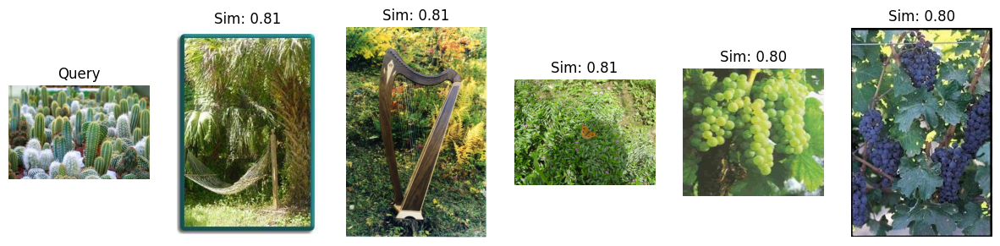

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Most similar images to 028.jpg:
028.camel/028_0108.jpg - Similarity: 0.7905263714228122
028.camel/028_0058.jpg - Similarity: 0.7661903372771723
050.covered-wagon/050_0025.jpg - Similarity: 0.7607908718793275
028.camel/028_0019.jpg - Similarity: 0.7562099236664775
014.blimp/014_0076.jpg - Similarity: 0.7540268594500287


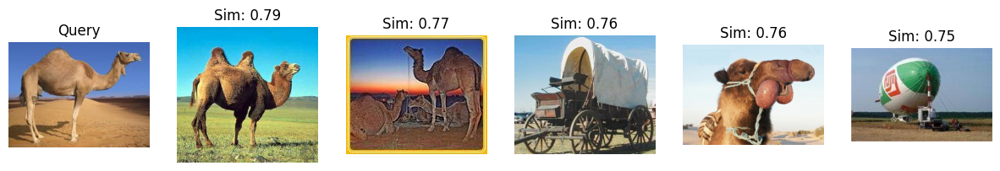

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 012.jpg:
001.ak47/001_0022.jpg - Similarity: 0.8272793598349029
012.binoculars/012_0056.jpg - Similarity: 0.8181595202899683
012.binoculars/012_0068.jpg - Similarity: 0.7888226945486955
012.binoculars/012_0159.jpg - Similarity: 0.784632660428648
001.ak47/001_0070.jpg - Similarity: 0.7734614599187675


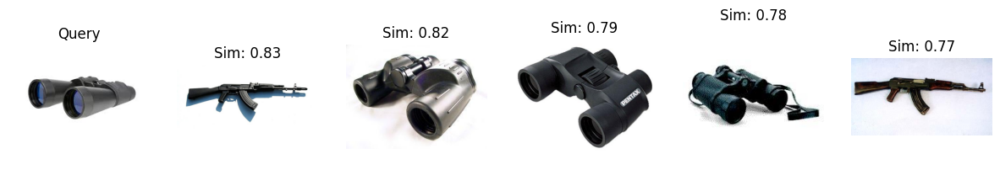

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 101.jpg:
101.bed/very-beautiful-luxury-comfortable-basic-600nw-2412997365.jpg - Similarity: 0.770658317978656
101.bed/picture-decorated-room-focusing-on-600nw-2517816045.jpg - Similarity: 0.7623996174612571
101.bed/bed-soft-white-pillows-cozy-600w-2275299653.jpg - Similarity: 0.7585163166015426
101.bed/comfortable-large-bed-beautiful-room-600nw-2533096449.jpg - Similarity: 0.7414316505153152
101.bed/download (32).jpg - Similarity: 0.7390821716443704


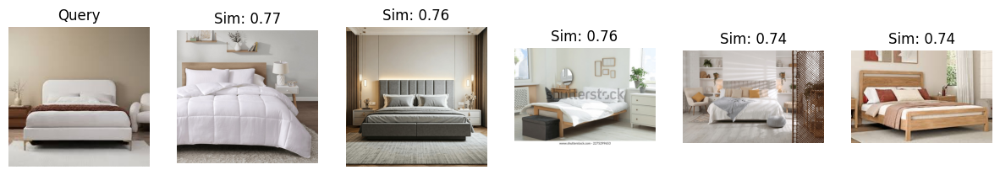

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 018.jpg:
018.bowling-pin/018_0034.jpg - Similarity: 0.8775602530179859
018.bowling-pin/018_0030.jpg - Similarity: 0.8640992040872439
018.bowling-pin/018_0085.jpg - Similarity: 0.8230826082325413
018.bowling-pin/018_0009.jpg - Similarity: 0.8154929566589451
018.bowling-pin/018_0036.jpg - Similarity: 0.8145399555004555


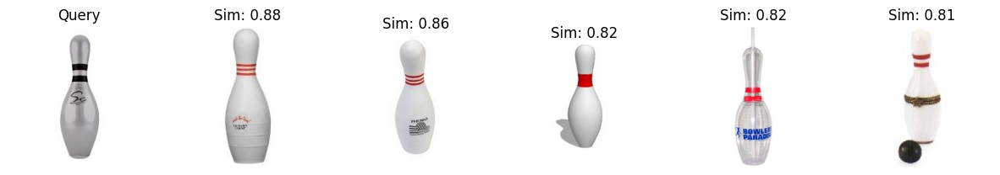

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 027.jpg:
027.calculator/027_0065.jpg - Similarity: 0.7484501195692078
012.binoculars/012_0165.jpg - Similarity: 0.7480829576409609
012.binoculars/012_0107.jpg - Similarity: 0.7274757347194823
057.dolphin-101/057_0095.jpg - Similarity: 0.7248621299718669
012.binoculars/012_0069.jpg - Similarity: 0.7246768210730625


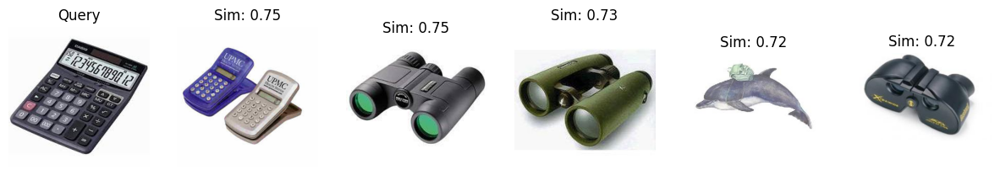

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 010.jpg:
005.baseball-glove/005_0103.jpg - Similarity: 0.7658122979718615
098.harp/098_0071.jpg - Similarity: 0.7128637616423202
028.camel/028_0044.jpg - Similarity: 0.703202751615715
071.fire-hydrant/071_0022.jpg - Similarity: 0.7020904017696716
098.harp/098_0050.jpg - Similarity: 0.7019154367119602


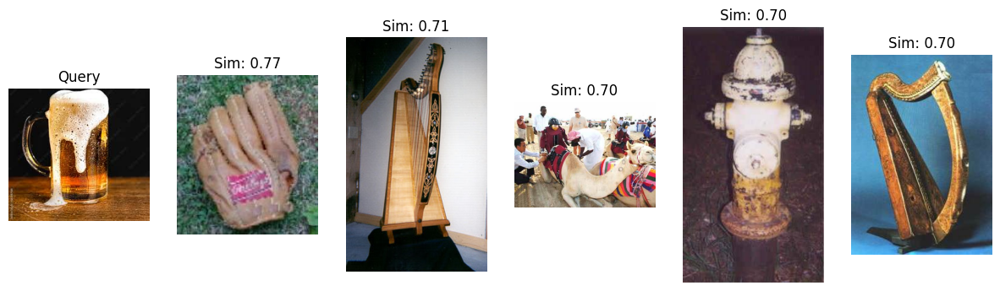

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 001.jpg:
001.ak47/001_0039.jpg - Similarity: 0.880501784523508
001.ak47/001_0043.jpg - Similarity: 0.8577443901837044
001.ak47/001_0070.jpg - Similarity: 0.8257234717436247
001.ak47/001_0025.jpg - Similarity: 0.8068433736954594
001.ak47/001_0022.jpg - Similarity: 0.8033317314307846


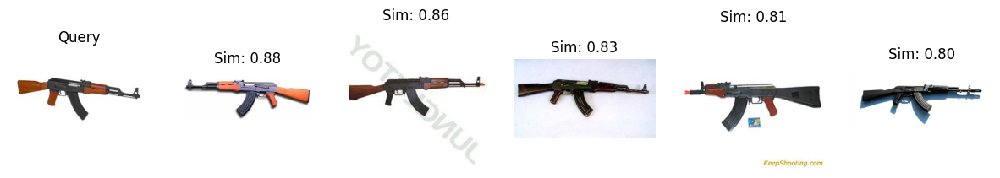

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 015.jpg:
093.grasshopper/093_0035.jpg - Similarity: 0.7046810766422857
077.french-horn/077_0045.jpg - Similarity: 0.6908264757119337
077.french-horn/077_0090.jpg - Similarity: 0.6710064816423247
104.sponge/sponge.jpg - Similarity: 0.6644984539131522
010.beer-mug/010_0012.jpg - Similarity: 0.6613054325852681


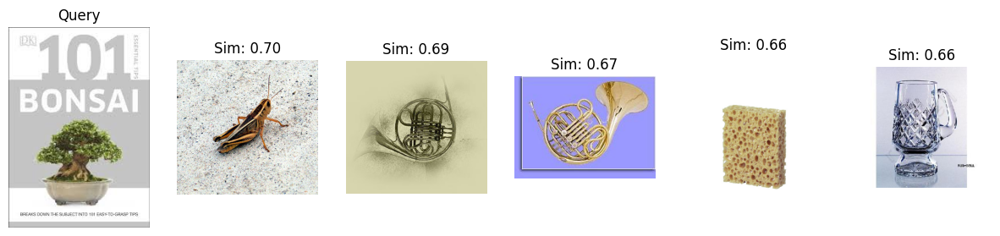

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 105.jpg:
105.broccoli/broccoli-florets.jpg - Similarity: 0.9959160352191938
105.broccoli/1000_F_975717966_DcUn4NwcnaYEwC2erylIiYkkRnhLmhrv.jpg - Similarity: 0.8638596582533444
105.broccoli/1000_F_878491804_8Fhg0ydEBY2wkSFLfsFtDbWv6sSjCKkB.jpg - Similarity: 0.840665297869352
105.broccoli/1000_F_712781156_TGxmKdHsG6ELVYp5cd07cTgf9OizUt8f.jpg - Similarity: 0.8389899043451305
105.broccoli/istockphoto-166754834-612x612.jpg - Similarity: 0.8384687852172703


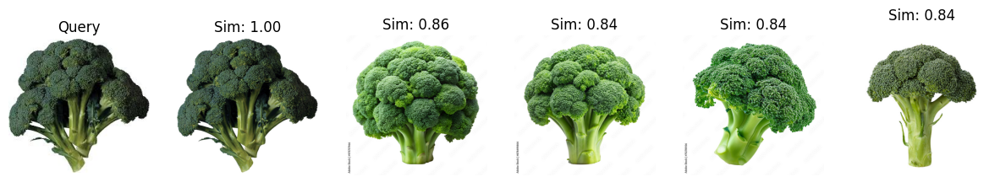

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 017.jpg:
017.bowling-ball/017_0009.jpg - Similarity: 0.8806259638423406
017.bowling-ball/017_0102.jpg - Similarity: 0.8673028694242564
051.cowboy-hat/051_0043.jpg - Similarity: 0.8540554156292909
017.bowling-ball/017_0018.jpg - Similarity: 0.8421979996074932
079.frisbee/079_0057.jpg - Similarity: 0.8413110002681465


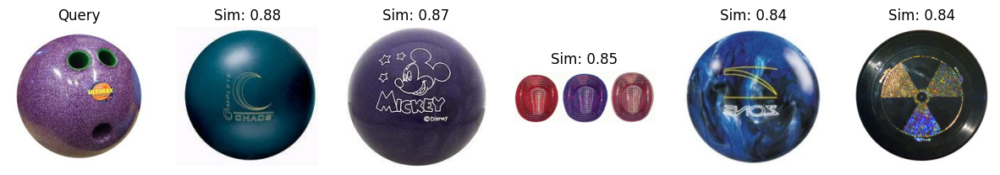

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 007.jpg:
038.chimp/038_0034.jpg - Similarity: 0.6793327512109427
029.cannon/029_0033.jpg - Similarity: 0.6603993156766332
090.gorilla/090_0020.jpg - Similarity: 0.6512123843993965
029.cannon/029_0075.jpg - Similarity: 0.6497446187171116
029.cannon/029_0051.jpg - Similarity: 0.6493440782978661


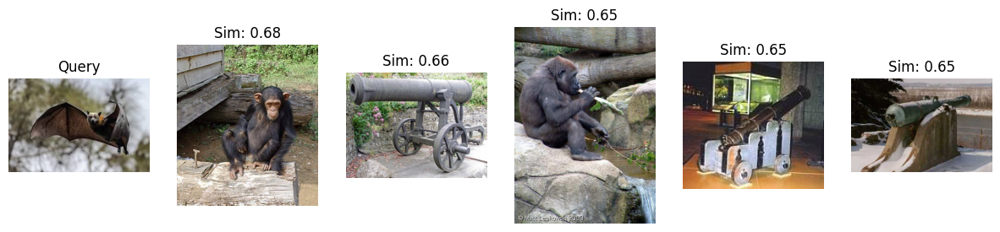

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Most similar images to 005.jpg:
005.baseball-glove/005_0074.jpg - Similarity: 0.7552204868330236
005.baseball-glove/005_0133.jpg - Similarity: 0.7380558621233407
005.baseball-glove/005_0132.jpg - Similarity: 0.7357672253871658
005.baseball-glove/005_0029.jpg - Similarity: 0.7312114011766374
094.guitar-pick/094_0086.jpg - Similarity: 0.7273892408593233


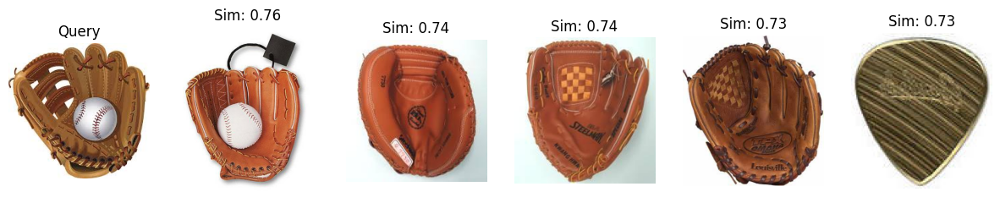

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Most similar images to 103.jpg:
001.ak47/001_0015.jpg - Similarity: 0.6647678678276222
001.ak47/001_0039.jpg - Similarity: 0.654146670424096
033.cd/033_0018.jpg - Similarity: 0.6412107165277862
001.ak47/001_0012.jpg - Similarity: 0.637965361416774
001.ak47/001_0034.jpg - Similarity: 0.6095392427067132


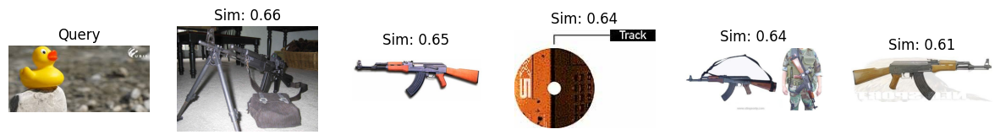

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 004.jpg:
021.breadmaker/021_0016.jpg - Similarity: 0.7848047816179473
008.bathtub/008_0165.jpg - Similarity: 0.778089429923037
021.breadmaker/021_0077.jpg - Similarity: 0.7448049183902349
008.bathtub/008_0092.jpg - Similarity: 0.7315997600582117
008.bathtub/008_0177.jpg - Similarity: 0.7181681620345005


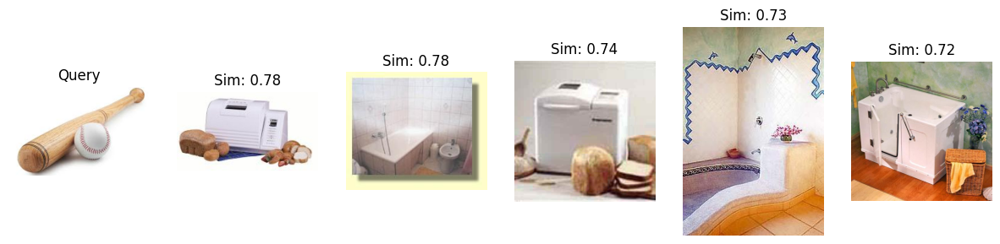

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 021.jpg:
101.bed/images (1).jpg - Similarity: 0.7098169965354758
008.bathtub/008_0026.jpg - Similarity: 0.6820617039027448
101.bed/bed-soft-white-pillows-cozy-600w-2275299653.jpg - Similarity: 0.6724558874341632
008.bathtub/008_0212.jpg - Similarity: 0.6702524052026867
026.cake/026_0027.jpg - Similarity: 0.6567235878486807


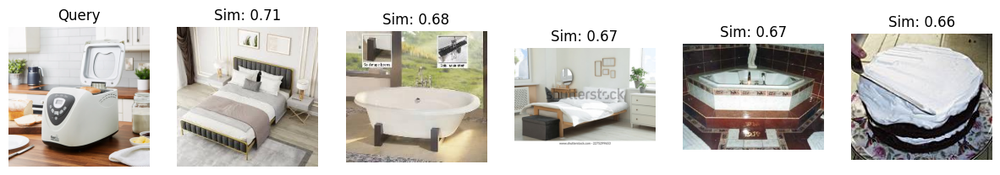

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Most similar images to 104.jpg:
104.sponge/6223004829857-_6_pieces-.jpg - Similarity: 0.9996940374110422
104.sponge/download (1).jpg - Similarity: 0.9228859274409621
104.sponge/keep-cleaning-sponge-compostable-household-sponges-andkeep-28557093011527.jpg - Similarity: 0.9139549078511764
104.sponge/download (2).jpg - Similarity: 0.9126407020282143
104.sponge/1000_F_578485746_7mtJOksV60EtdOjViSw4gwERm0GShltS.jpg - Similarity: 0.9060324339530663


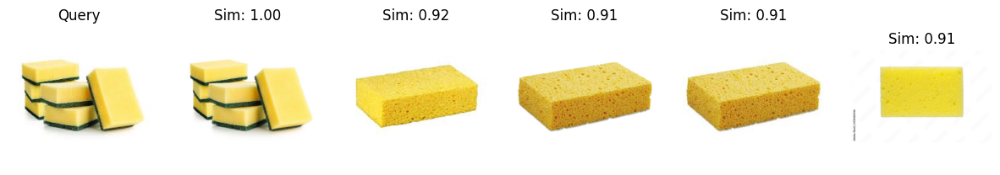

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 039.jpg:
004.baseball-bat/004_0009.jpg - Similarity: 0.8957449267812424
004.baseball-bat/004_0120.jpg - Similarity: 0.8805536879752149
004.baseball-bat/004_0098.jpg - Similarity: 0.8735415395317833
067.eyeglasses/067_0011.jpg - Similarity: 0.8639741348692306
004.baseball-bat/004_0084.jpg - Similarity: 0.8562389207742191


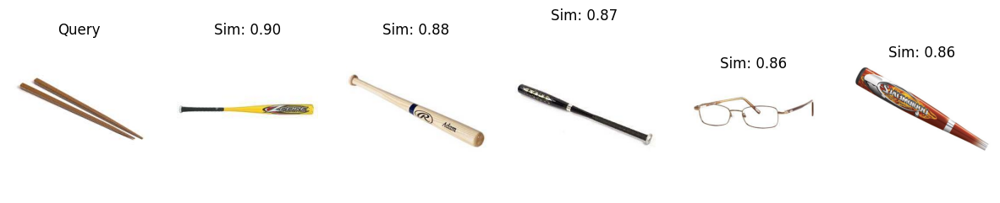

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 038.jpg:
038.chimp/038_0087.jpg - Similarity: 0.8718507438982963
090.gorilla/090_0055.jpg - Similarity: 0.8703533341425802
090.gorilla/090_0154.jpg - Similarity: 0.8621864229766396
090.gorilla/090_0003.jpg - Similarity: 0.8621790084922815
090.gorilla/090_0037.jpg - Similarity: 0.8614070717753092


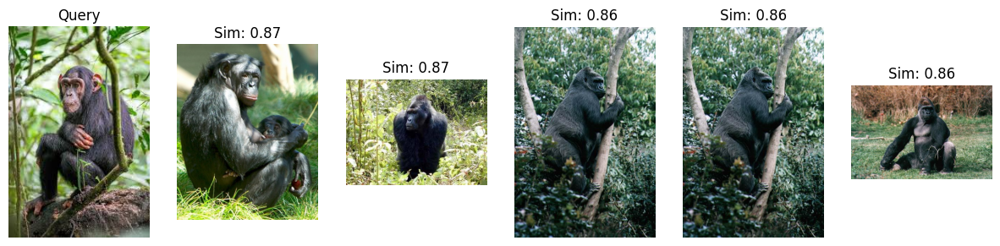

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 003.jpg:
058.doorknob/058_0075.jpg - Similarity: 0.6994256180020338
058.doorknob/058_0015.jpg - Similarity: 0.6931542482140353
066.ewer-101/066_0029.jpg - Similarity: 0.6787128981922679
064.elephant-101/064_0035.jpg - Similarity: 0.6722421310552804
042.coffin/042_0017.jpg - Similarity: 0.6720358141015118


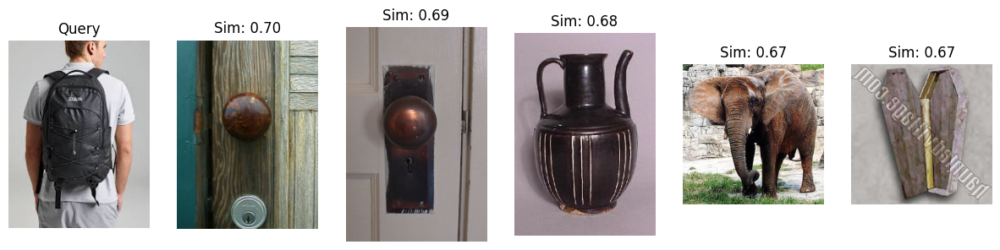

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 102.jpg:
102.kite/download.jpg - Similarity: 0.9999969429478622
102.kite/hq-kites-eddy-galaxy-bella-luna-toys_5_1800x1800.jpg - Similarity: 0.999865364543454
102.kite/dragons-kite-flying-fly-sky_pxfuel dot com.jpg - Similarity: 0.8870754444482348
102.kite/1fa45e95f136922d8fc0aea3fbe37531.jpg - Similarity: 0.8648846729545314
102.kite/360_F_933565407_FuTvhAC0vKsvobCz6TJqEsoteahCQsld.jpg - Similarity: 0.8566207466646913


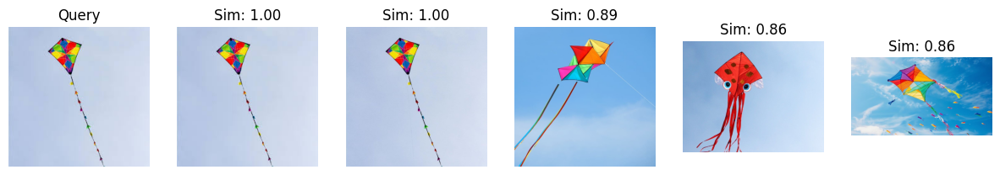

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 031.jpg:
010.beer-mug/010_0014.jpg - Similarity: 0.6777022755926551
022.buddha-101/022_0073.jpg - Similarity: 0.6487184283527863
022.buddha-101/022_0009.jpg - Similarity: 0.643021158575202
066.ewer-101/066_0037.jpg - Similarity: 0.6332977699743719
022.buddha-101/022_0032.jpg - Similarity: 0.6303379655715109


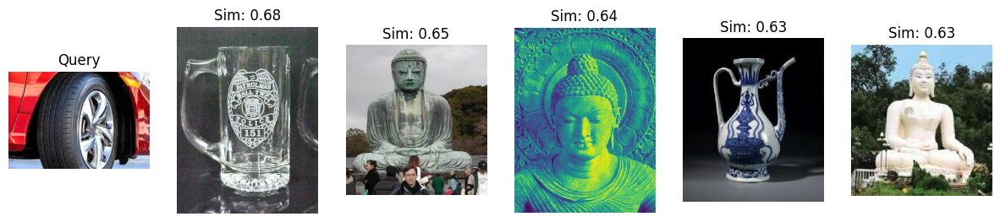

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 041.jpg:
008.bathtub/008_0126.jpg - Similarity: 0.7060569948720247
039.chopsticks/039_0030.jpg - Similarity: 0.6967457273734189
063.electric-guitar-101/063_0091.jpg - Similarity: 0.6836611643277423
039.chopsticks/039_0044.jpg - Similarity: 0.6628679437818445
039.chopsticks/039_0013.jpg - Similarity: 0.6597073601251878


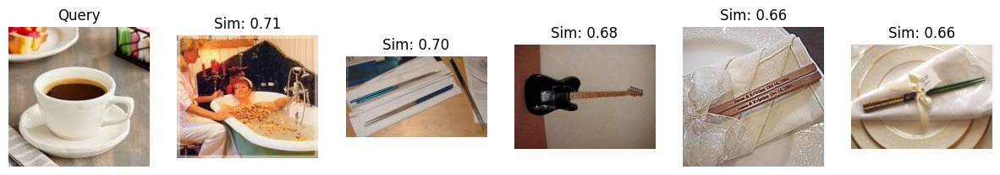

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 020.jpg:
048.conch/048_0010.jpg - Similarity: 0.7316022372000409
065.elk/065_0099.jpg - Similarity: 0.6946155633769066
043.coin/043_0033.jpg - Similarity: 0.6896954386384616
009.bear/009_0034.jpg - Similarity: 0.6687622667714949
106.vase/chloe-bolton-R0qthXq3jec-unsplash_1.jpg - Similarity: 0.653459107402987


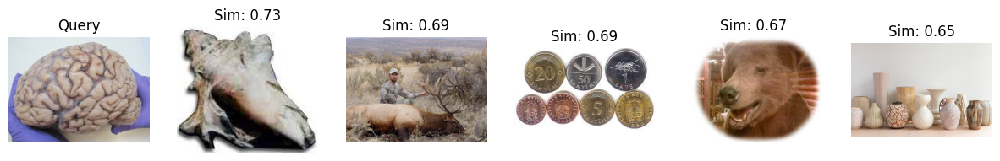

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 037.jpg:
022.buddha-101/022_0022.jpg - Similarity: 0.744485516327658
036.chandelier-101/036_0105.jpg - Similarity: 0.7432357969638981
036.chandelier-101/036_0059.jpg - Similarity: 0.7376953299442194
066.ewer-101/066_0020.jpg - Similarity: 0.7359521470322965
036.chandelier-101/036_0087.jpg - Similarity: 0.7209611159676957


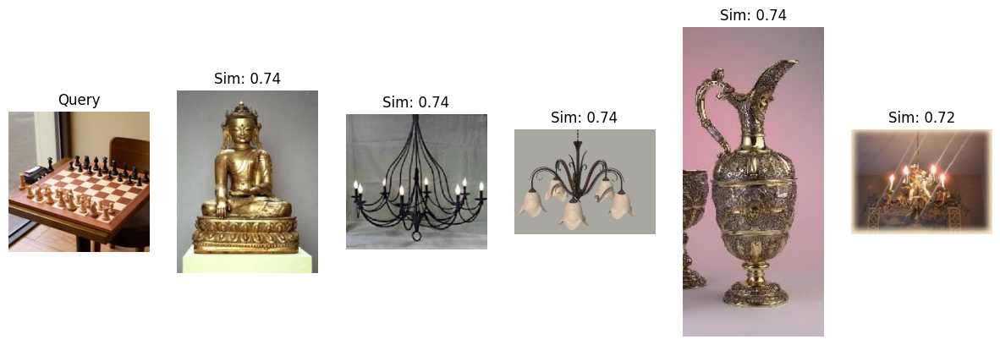

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 022.jpg:
022.buddha-101/022_0029.jpg - Similarity: 0.7553339925442399
022.buddha-101/022_0041.jpg - Similarity: 0.7500580573783785
022.buddha-101/022_0054.jpg - Similarity: 0.7332480572515412
025.cactus/025_0019.jpg - Similarity: 0.7306233446336725
022.buddha-101/022_0046.jpg - Similarity: 0.7117869019799276


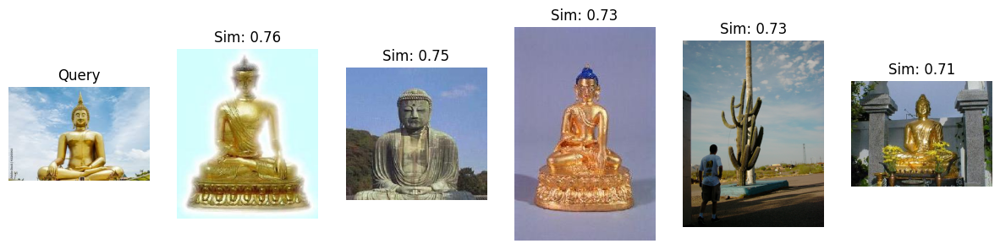

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Most similar images to 032.jpg:
032.cartman/032_0034.jpg - Similarity: 0.9415886194074384
032.cartman/032_0058.jpg - Similarity: 0.92519992943486
032.cartman/032_0088.jpg - Similarity: 0.923212391506429
032.cartman/032_0075.jpg - Similarity: 0.8998077090552467
032.cartman/032_0063.jpg - Similarity: 0.8964568365525918


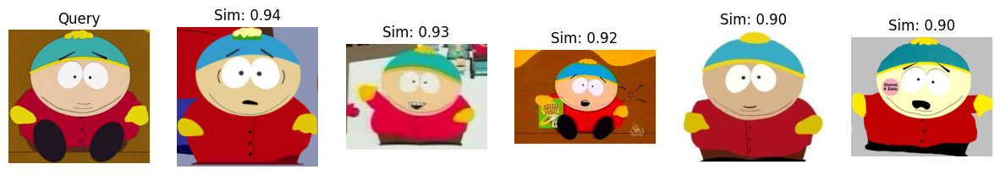

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 026.jpg:
005.baseball-glove/005_0057.jpg - Similarity: 0.6847037786186704
026.cake/026_0068.jpg - Similarity: 0.6673049282696867
052.crab-101/052_0029.jpg - Similarity: 0.6069958424056104
014.blimp/014_0026.jpg - Similarity: 0.6068474512387212
037.chess-board/037_0067.jpg - Similarity: 0.6062704630843961


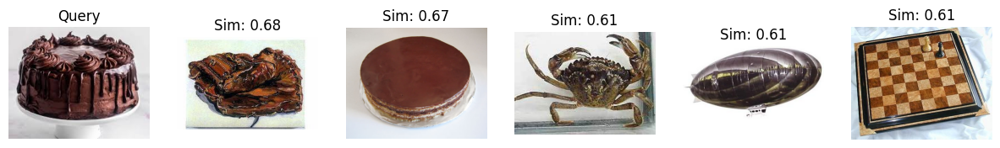

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 019.jpg:
005.baseball-glove/005_0008.jpg - Similarity: 0.6847772418298753
005.baseball-glove/005_0115.jpg - Similarity: 0.6526215248255449
005.baseball-glove/005_0033.jpg - Similarity: 0.6491974845948596
005.baseball-glove/005_0087.jpg - Similarity: 0.6368955916890575
005.baseball-glove/005_0042.jpg - Similarity: 0.6349995790195583


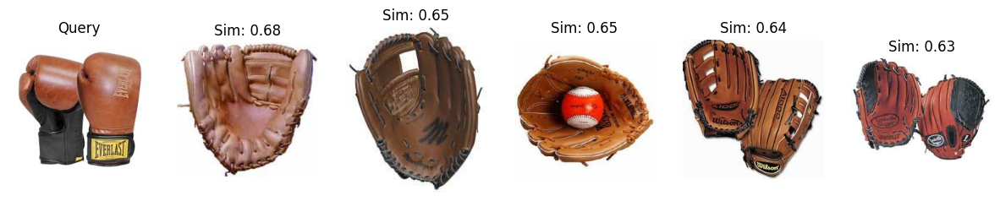

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 030.jpg:
072.fire-truck/072_0103.jpg - Similarity: 0.8515940856746385
072.fire-truck/072_0024.jpg - Similarity: 0.8497319610339862
072.fire-truck/072_0054.jpg - Similarity: 0.8357046513579274
072.fire-truck/072_0077.jpg - Similarity: 0.819509399608869
072.fire-truck/072_0052.jpg - Similarity: 0.8059617156475231


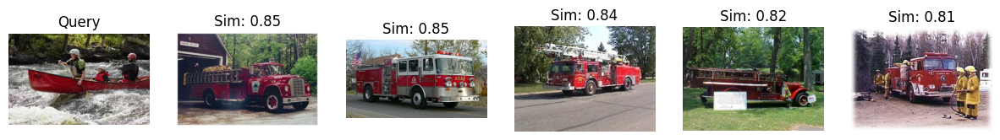

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 035.jpg:
035.cereal-box/035_0069.jpg - Similarity: 0.7862587142466045
104.sponge/istockphoto-483721127-612x612.jpg - Similarity: 0.7604548921812465
035.cereal-box/035_0025.jpg - Similarity: 0.7340245196966813
033.cd/033_0090.jpg - Similarity: 0.6855064735953977
035.cereal-box/035_0079.jpg - Similarity: 0.6656240843670964


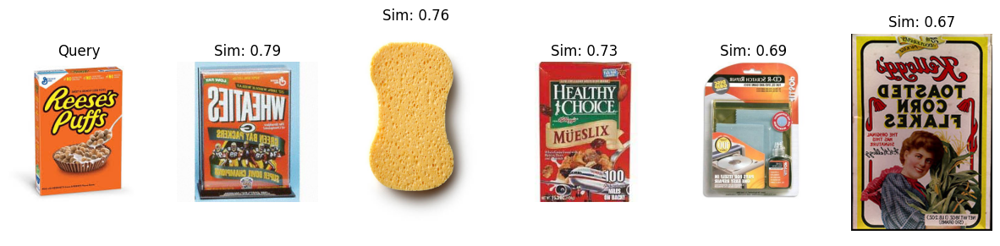

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Most similar images to 023.jpg:
023.bulldozer/023_0001.jpg - Similarity: 0.8132189112042144
023.bulldozer/023_0108.jpg - Similarity: 0.7512701192092006
023.bulldozer/023_0003.jpg - Similarity: 0.7323565289502058
023.bulldozer/023_0101.jpg - Similarity: 0.7285988629970978
023.bulldozer/023_0049.jpg - Similarity: 0.7234240319673491


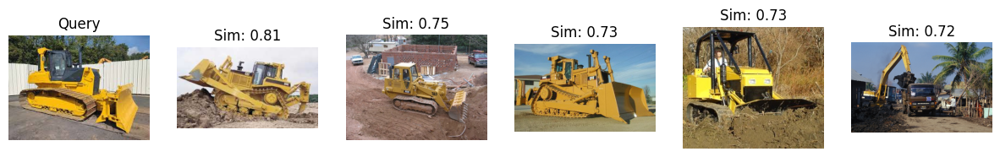

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 009.jpg:
009.bear/009_0026.jpg - Similarity: 0.8370921163194943
064.elephant-101/064_0098.jpg - Similarity: 0.8275233467086673
064.elephant-101/064_0013.jpg - Similarity: 0.8267815823787888
064.elephant-101/064_0010.jpg - Similarity: 0.8248669619334981
064.elephant-101/064_0062.jpg - Similarity: 0.8245124463225748


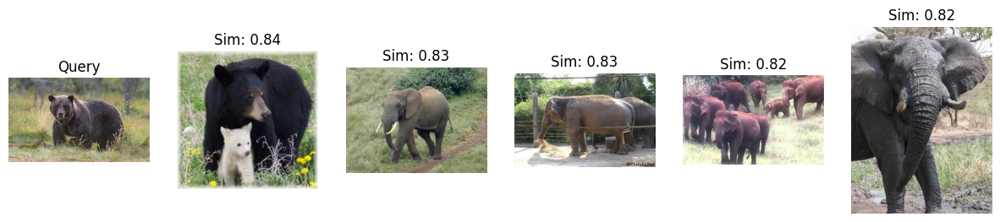

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 008.jpg:
026.cake/026_0027.jpg - Similarity: 0.7079417806060974
101.bed/download (11).jpg - Similarity: 0.6973129043138325
088.golf-ball/088_0098.jpg - Similarity: 0.6827542105679888
101.bed/images (9).jpg - Similarity: 0.6775882734590016
101.bed/56101515SD00565_A2_500x500.jpg - Similarity: 0.6645182879816633


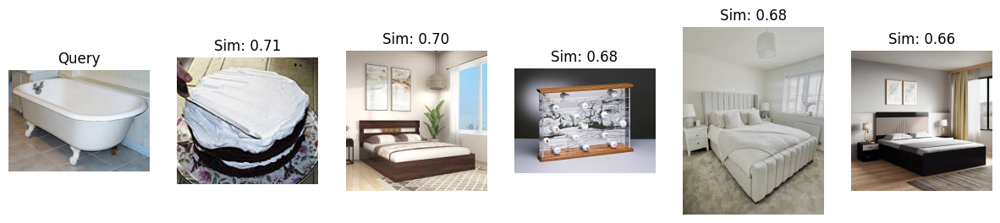

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 013.jpg:
090.gorilla/090_0075.jpg - Similarity: 0.8765647831286514
013.birdbath/013_0016.jpg - Similarity: 0.8673156564958815
013.birdbath/013_0012.jpg - Similarity: 0.8524431827620751
092.grapes/092_0184.jpg - Similarity: 0.8463983993862232
068.fern/068_0013.jpg - Similarity: 0.8310838266089653


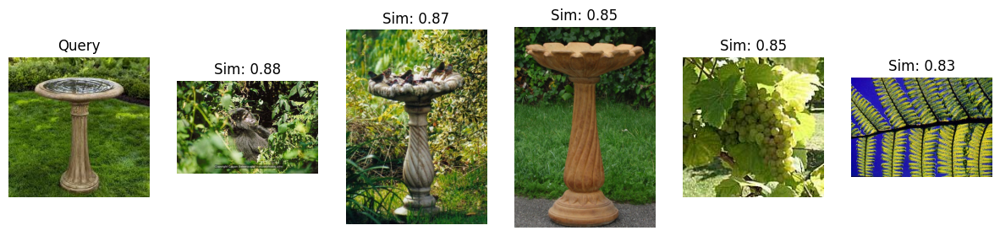

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 016.jpg:
016.boom-box/016_0052.jpg - Similarity: 0.7086548701040786
072.fire-truck/072_0071.jpg - Similarity: 0.6746144536771318
016.boom-box/016_0090.jpg - Similarity: 0.6633798470988961
033.cd/033_0067.jpg - Similarity: 0.6623176973514003
016.boom-box/016_0006.jpg - Similarity: 0.6491028765866258


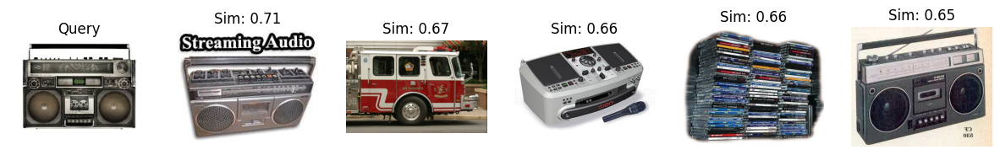

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Most similar images to 040.jpg:
040.cockroach/040_0043.jpg - Similarity: 0.7643772623454536
040.cockroach/040_0022.jpg - Similarity: 0.717198588419503
040.cockroach/040_0066.jpg - Similarity: 0.6819392684227038
052.crab-101/052_0064.jpg - Similarity: 0.6813958387755107
095.hamburger/095_0086.jpg - Similarity: 0.678574921256572


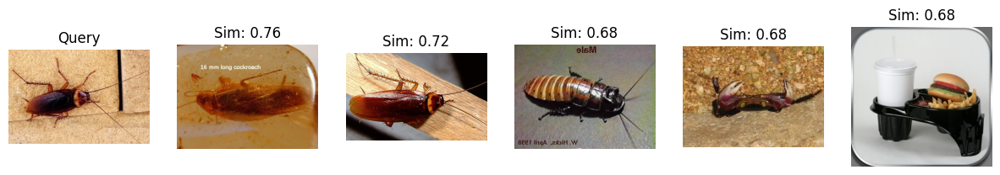

In [212]:
embeddings_df = pd.read_csv('/kaggle/working/embeddings.csv')
base_dir = "/kaggle/input/search-engine-data-small/Data"

own_test_paths = os.listdir("/kaggle/input/data-test/Test_data")
own_test_paths = ["/kaggle/input/data-test/Test_data/" + file for file in own_test_paths]

num_items = len(own_test_paths)

for i in range(num_items):
    query_image_path = own_test_paths[i] 
    most_similar_filenames, similarities = get_most_similar_images(query_image_path,base_dir, embedding_model, embeddings_df, k=5)

    print(f"Most similar images to {os.path.basename(query_image_path)}:")
    for filename, similarity in zip(most_similar_filenames, similarities):
        print(f"{filename} - Similarity: {similarity}")

    display_top_k(query_image_path, most_similar_filenames, similarities, base_dir)

In [210]:
embeddings_df = pd.read_csv('/kaggle/working/embeddings.csv')
print(len(embeddings_df))
embeddings_df.head()

11496


,0,1,2,3,4,5,6,7,8,9,...,503,504,505,506,507,508,509,510,511,filename
0,0.00000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.187366,0.000000,3.100825,0.000000,2.161008,0.0,0.0,0.0,001.ak47/001_0062.jpg
1,0.00000,0.628251,0.0,0.000000,0.000000,0.0,0.577377,0.0,0.0,0.0,...,0.0,2.379224,0.546482,0.000000,0.000000,0.482775,0.0,0.0,0.0,001.ak47/001_0041.jpg
2,0.53152,0.000000,0.0,0.000000,0.826637,0.0,0.399375,0.0,0.0,0.0,...,0.0,0.000000,1.009245,0.645464,0.903761,1.465139,0.0,0.0,0.0,001.ak47/001_0038.jpg
3,0.09475,0.000000,0.0,1.776481,1.566781,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,1.003359,6.085833,0.000000,3.737656,0.0,0.0,0.0,001.ak47/001_0039.jpg
4,0.00000,0.000000,0.0,0.000000,2.629350,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.000000,5.099857,1.017282,6.231092,0.0,0.0,0.0,001.ak47/001_0070.jpg


In [213]:
model.save("classification_model.keras")

In [214]:
model_load = load_model("/kaggle/working/classification_model.keras")